In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tabulate import tabulate
from sklearn.preprocessing import MultiLabelBinarizer
from datetime import datetime

import glob
import os

In [2]:
path_central_novice = './CentralR-N'
all_files_central_novice = sorted(glob.glob(os.path.join(path_central_novice, "*.json")))

central = []
for f in all_files_central_novice:
    df = pd.read_json(f)
    df['logDate'] = f[25:35]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    central.append(df)
    
central_novice = pd.concat(central, ignore_index=True)
central_novice['region'] = 'Central'

path_east_novice = './EastR-N'
all_files_east_novice = sorted(glob.glob(os.path.join(path_east_novice, "*.json")))

east = []
for f in all_files_east_novice:
    df = pd.read_json(f)
    df['logDate'] = f[22:32]
    df['logDate'] = pd.to_datetime(df['logDate'], format='%Y-%m-%d')
    east.append(df)
    
east_novice = pd.concat(east, ignore_index=True)
east_novice['region'] = 'East'

novice = pd.concat(([central_novice, east_novice]), ignore_index=True)
X = novice.drop(['annId', 'urls', 'siteIds', 'animeScore', 'selfAnswer', 'fromList', 'gameMode', 'correct'], axis=1).copy()

def find_n_correct(players):
    i = 0
    for player in players:
        if player['correct'] == True:
            i += 1
    return i

def find_gt(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x]
    return np.array(guess_times).mean()

def find_gt_filter(players):
    guess_times = [x['guessTime'] for x in players if 'guessTime' in x and x['guessTime'] < 15000]
    return np.array(guess_times).mean()

def find_ng(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_ng_filter(players):
    no_guess = np.zeros(len(players))
    for i, x in enumerate(players):
        val = 0
        if x['active'] == True:
            if 'guessTime' in x and x['guessTime'] < 15000:
                val = 0
            else:
                val = 1
        else:
            continue
        no_guess[i] = val
    return no_guess.sum()

def find_cgt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == True)])
    return np.array(guess_times).mean()

def find_igt(players):
    guess_times = np.array([x['guessTime'] for x in players if ('guessTime' in x and x['correct'] == False)])
    return np.array(guess_times).mean()

def find_scores(players):
    scores = np.zeros(len(players))
    for i, x in enumerate(players):
        scores[i] = x['score']
    return scores

def shortest_answer_length(answers):
    return len(min(answers, key=len))

def find_shortest_answer(answers):
    return min(answers, key=len)

def fastest_guess(players):
    guess_times = np.array([x['guessTime'] if 'guessTime' in x else 20000 for x in players])
    return np.min(guess_times)

def fastest_correct_guess(players):
    guess_times = np.array([x['guessTime'] if ('guessTime' in x and x['correct'] == True) else 20000 for x in players])
    return np.min(guess_times)

X['avgGuessTime'] = X['players'].apply(find_gt)
X['avgGuessTime_15k'] = X['players'].apply(find_gt_filter)
X['n_correctGuess'] = X['players'].apply(find_n_correct)
X['n_noGuess'] = X['players'].apply(find_ng)
X['n_noGuess_15k'] = X['players'].apply(find_ng_filter)
X['p_noGuess'] = X['n_noGuess']/X['activePlayers'] *100
X['p_noGuess_15k'] = X['n_noGuess_15k']/X['activePlayers'] *100
X['p_correctGuess'] = X['n_correctGuess']/X['activePlayers']*100
X['avgGuessTime_c'] = X['players'].apply(find_cgt)
X['avgGuessTime_i'] = X['players'].apply(find_igt)
X['type_noNumber'] = X['type'].str.split().str[0]
X['samplePercent'] = X['startSample']/X['videoLength']
X['AiredDate'] = X['vintage'].replace({'Winter': '1', 'Spring': '4', 'Summer': '7', 'Fall': '10'}, regex=True)
X['AiredDate'] = pd.to_datetime(X['AiredDate'], format='%m %Y')
X['shortest_length'] = X['altAnswers'].apply(shortest_answer_length)
X['shortest_answer'] = X['altAnswers'].apply(find_shortest_answer)
X['fastest'] = X['players'].apply(fastest_guess)
X['fastest_correct'] = X['players'].apply(fastest_correct_guess)

n_games = X.shape[0]/45
songs_played = X.shape[0]
guess_rate = X['p_correctGuess'].mean()
guess_time = X['avgGuessTime'].mean()
no_guess_rate = X['p_noGuess'].mean()
diff = X['difficulty'].mean()

op = X.loc[X['type_noNumber'] == 'Opening']
op_played = op.shape[0]
op_rate = op['p_correctGuess'].mean()
op_diff = op['difficulty'].mean()

ed = X.loc[X['type_noNumber'] == 'Ending']
ed_played = ed.shape[0]
ed_rate = ed['p_correctGuess'].mean()
ed_diff = ed['difficulty'].mean()

ins = X.loc[X['type_noNumber'] == 'Insert']
in_played = ins.shape[0]
in_rate = ins['p_correctGuess'].mean()
in_diff = ins['difficulty'].mean()

last_song = pd.DataFrame(X.loc[X['songNumber'] == 45]).reset_index(drop=True)
last_song['Scores'] = last_song['players'].apply(find_scores)

finalScores = np.concatenate(last_song['Scores'].values).astype(int)
end_mean = finalScores.mean()
end_std = finalScores.std()
end_max = finalScores.max()

mlb = MultiLabelBinarizer()
s = X['tags']
dummy = pd.DataFrame(mlb.fit_transform(s), columns=mlb.classes_, index=X.index, dtype=np.bool_)
X = pd.concat([X, dummy], axis=1)

mlb2 = MultiLabelBinarizer()
s = X['genre']
dummy = pd.DataFrame(mlb2.fit_transform(s), columns=mlb2.classes_, index=X.index, dtype=np.bool_)
X = pd.concat([X, dummy], axis=1)

X = X.drop(['tags', 'genre'], axis=1)

genres = X[mlb2.classes_].sum().sort_values(ascending=False)
g_perc = pd.Series(index=mlb2.classes_, dtype='float64')
for genre in mlb2.classes_:
    g_perc[genre] = X.loc[X[genre] == 1]['p_correctGuess'].mean()
genres = pd.concat([genres, g_perc], axis=1)
genres.columns = ['Count', 'Guess rate']
genres = genres.sort_values(by='Guess rate', ascending=False)

tags = X[mlb.classes_].sum().sort_values(ascending=False)
t_perc = pd.Series(index=mlb.classes_, dtype='float64')
for tag in mlb.classes_:
    t_perc[tag] = X.loc[X[tag] == 1]['p_correctGuess'].mean()
tags = pd.concat([tags, t_perc], axis=1)
tags.columns = ['Count', 'Guess rate']
tags = tags.sort_values(by='Count', ascending=False).head(30).sort_values(by='Guess rate', ascending=False)

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1242/2108070730.py:75: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()
/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1242/2108070730.py:79: RuntimeWarning: Mean of empty slice.
  return np.array(guess_times).mean()


In [3]:
general_table = [
    ['Games played', n_games],
    ['Songs played', songs_played],
    ['Correct guess rate (%)', '{:.2f}'.format(guess_rate)],
    ['Average difficulty', '{:.2f}'.format(diff)],
    ['Average guess time (s)', '{:.2f}'.format(guess_time/1000)],
    ['No guess rate (%)', '{:.2f}'.format(no_guess_rate)]
]
print(tabulate(general_table, tablefmt='fancy_grid'))

types_table = {
    'Openings': [op_played, op_rate, op_diff],
    'Endings': [ed_played, ed_rate, ed_diff],
    'Inserts': [in_played, in_rate, in_diff]
}
print(tabulate(types_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Songs played', 'Correct guess rate (%)', 'Average difficulty']
              ))

ends_table = {
    'Final score': ['{:.2f}'.format(end_mean), '{:.2f}'.format(end_std), end_max]
}
print(tabulate(ends_table, tablefmt='fancy_grid', headers='keys', showindex=[
    'Mean', 'STD', 'Highest']
              ))

╒════════════════════════╤═════════╕
│ Games played           │  160    │
├────────────────────────┼─────────┤
│ Songs played           │ 7200    │
├────────────────────────┼─────────┤
│ Correct guess rate (%) │   40.57 │
├────────────────────────┼─────────┤
│ Average difficulty     │   46.1  │
├────────────────────────┼─────────┤
│ Average guess time (s) │   13.22 │
├────────────────────────┼─────────┤
│ No guess rate (%)      │   27.29 │
╘════════════════════════╧═════════╛
╒════════════════════════╤════════════╤═══════════╤═══════════╕
│                        │   Openings │   Endings │   Inserts │
╞════════════════════════╪════════════╪═══════════╪═══════════╡
│ Songs played           │  4320      │ 1600      │ 1280      │
├────────────────────────┼────────────┼───────────┼───────────┤
│ Correct guess rate (%) │    46.4395 │   32.4751 │   30.8809 │
├────────────────────────┼────────────┼───────────┼───────────┤
│ Average difficulty     │    50.138  │   40.2284 │   39.8286 │
╘══════

In [4]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [5]:
def find_jp(names):
    if 'romaji' in names:
        name = names['romaji']
    else:
        raise Exception('No jp name')
    return name
X['anime_jp'] = X['anime'].apply(find_jp)

lbs = {'difficulty':'Difficulty',
      'artist':'Artist',
      'name':'Song',
      'p_correctGuess':'Correct percent',
      'p_noGuess':'No guess percent',
      'anime_jp':'Anime',
      'avgGuessTime':'Average guess time',
      'AiredDate': 'Aired date',
      'avgGuessTime_c':'Correct avg. guess time',
      'avgGuessTime_i':'Incorrect avg. guess time',
      'type_noNumber':'Song type'}

hover_dt = {'artist':True,
           'name':True,
           'anime_jp':True,
           'avgGuessTime':True,
           'difficulty':':.1f',
           'p_noGuess':':.1f',
           'p_correctGuess':':.1f',
           'avgGuessTime':':.1f',
           'avgGuessTime_c':':.1f',
           'avgGuessTime_i':':.1f',}

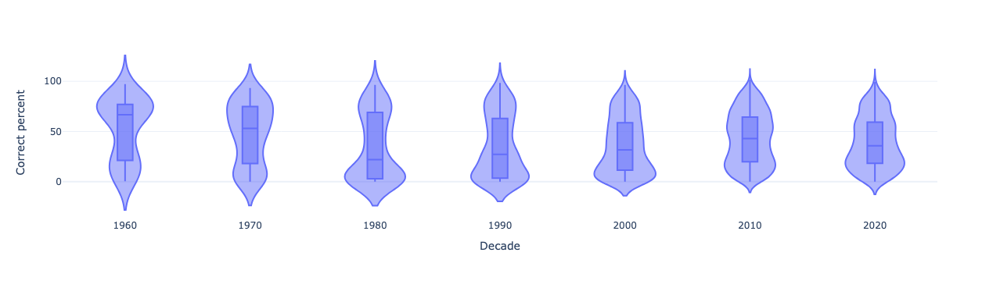

In [6]:
X['Decade'] = X['AiredDate'].dt.year//10*10 
px.violin(X, x='Decade', y='p_correctGuess', template='plotly_white', box=True, labels=lbs)

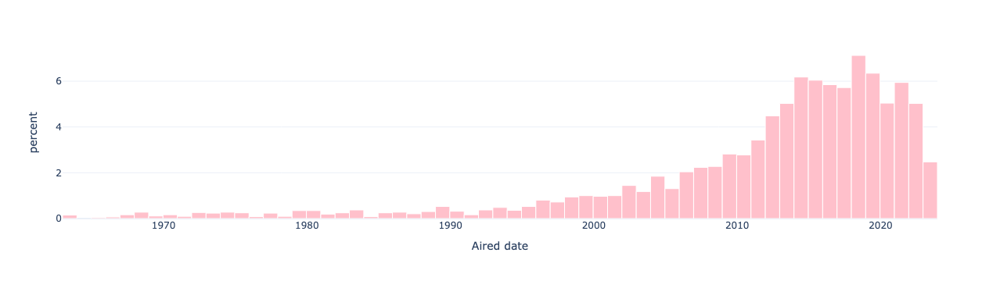

In [7]:
fig = px.histogram(X, x='AiredDate', labels=lbs, template='plotly_white', color_discrete_sequence=['pink'], histnorm='percent')
fig.update_traces(marker_line_width=1, marker_line_color="white")
fig.show()

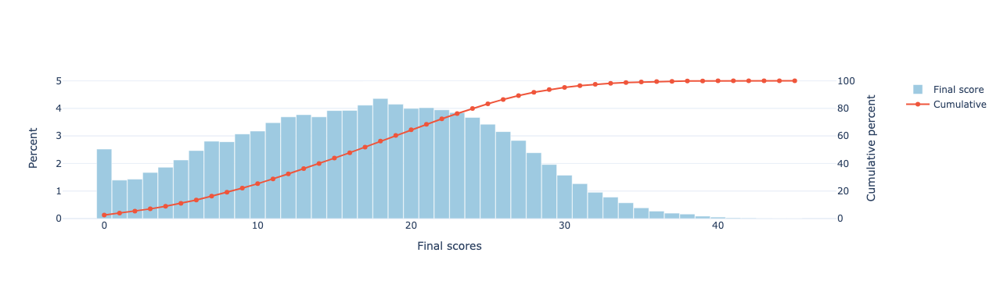

In [8]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

hist = np.histogram(finalScores, bins=np.arange(47)-0.01)[0]
hist_density = np.histogram(finalScores, bins=np.arange(47)-0.01, density=True)[0]*100
fig.add_trace(
    go.Bar(x=np.arange(0, 46), y=hist_density, name='Final score', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(158,202,225)')
fig.add_trace(
    go.Scatter(x=np.arange(0, 46), y=hist_density.cumsum() ,mode='lines+markers', name='Cumulative'),
    secondary_y=True,
)
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Percent'),
        side='left',
        range=[0, 5.1],
    ),
    yaxis2=dict(
        title=dict(text='Cumulative percent'),
        side='right',
        range=[0, 102],
        overlaying='y',
        tickmode='auto',
    ),)
fig.update_xaxes(title_text='Final scores')
fig

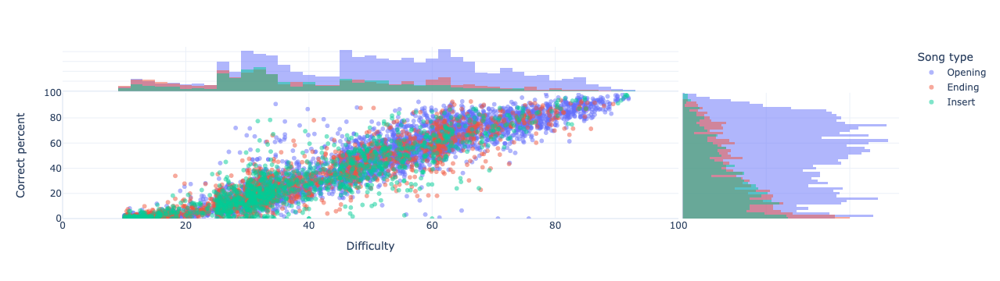

In [9]:
px.scatter(
        X,
        x='difficulty',
        y='p_correctGuess',
        color='type_noNumber',
        marginal_x='histogram', 
        marginal_y='histogram',
        hover_data=hover_dt,
        labels=lbs,
        trendline=None,
        template='plotly_white',
        range_x=[0, 100],
        range_y=[0, 100],
        opacity=0.5
        )

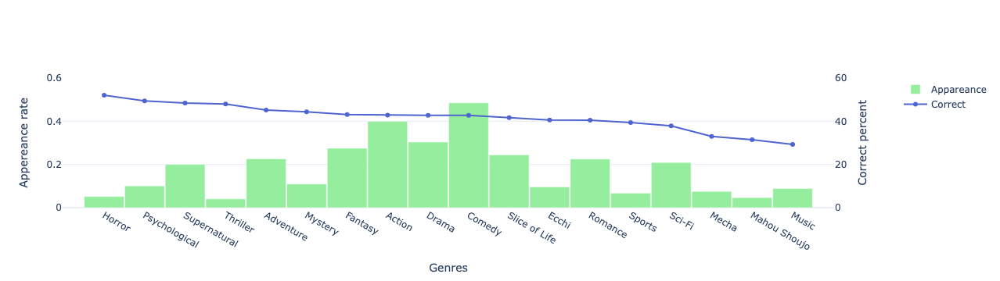

In [10]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Bar(x=genres['Count'].keys(), y=genres['Count']/songs_played, name='Appareance', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(149,237,158)')
fig.add_trace(
    go.Scatter(x=genres['Count'].keys(), y=genres['Guess rate'], mode='lines+markers', name='Correct'),
    secondary_y=True,
)
fig.update_traces(marker_color='rgb(78, 100, 207)', selector=dict(type='scatter'))
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Appereance rate'),
        side='left',
        range=[0, 0.6],
    ),
    yaxis2=dict(
        title=dict(text='Correct percent'),
        side='right',
        range=[0, 60],
        overlaying='y',
    ),)
fig.update_xaxes(title_text='Genres')
fig

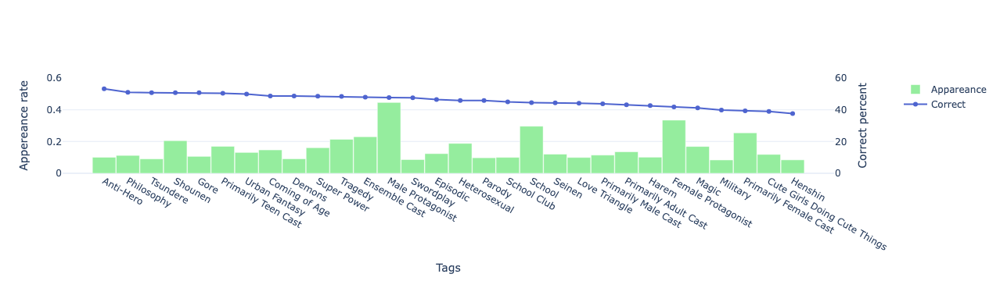

In [11]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Bar(x=tags['Count'].keys(), y=tags['Count']/songs_played, name='Appareance', width=0.98),
    secondary_y=False,
)
fig.update_traces(marker_color='rgb(149,237,158)')
fig.add_trace(
    go.Scatter(x=tags['Count'].keys(), y=tags['Guess rate'], mode='lines+markers', name='Correct'),
    secondary_y=True,
)
fig.update_traces(marker_color='rgb(78, 100, 207)', selector=dict(type='scatter'))
fig.update_layout(template='plotly_white', yaxis=dict(
        title=dict(text='Appereance rate'),
        side='left',
        range=[0, 0.6],
    ),
    yaxis2=dict(
        title=dict(text='Correct percent'),
        side='right',
        range=[0, 60],
        overlaying='y',
    ),)
fig.update_xaxes(title_text='Tags')
fig

In [12]:
def find_gr_by_gt(players, threshold, diff):
    c_guess_rate = np.array([])
    for i, x in enumerate(players):
        if x['active'] == False:
            continue
        if 'guessTime' not in x:
            continue
        if x['guessTime'] > threshold:
            continue
        if x['guessTime'] < threshold-diff:
            continue
        if x['correct']:
            c_guess_rate = np.append(c_guess_rate, 1)
        else:
            c_guess_rate = np.append(c_guess_rate, 0)
    return c_guess_rate.mean()

In [13]:
thresholds = [1000*x for x in range(1, 21)]
thresholds_p = [1000*x for x in range(1, 21)]
for i, t in enumerate(thresholds):
    thresholds_p[i] = pd.Series(X['players'].apply(find_gr_by_gt, args=[t, 1000]), name=f's{t}')

/var/folders/7h/lb5014td1szbmsjlhhy0swz00000gn/T/ipykernel_1242/418440418.py:16: RuntimeWarning:

Mean of empty slice.



In [14]:
guess_gt = pd.DataFrame(thresholds_p).transpose()

In [15]:
m_guess_gt = guess_gt.mean(axis=0)

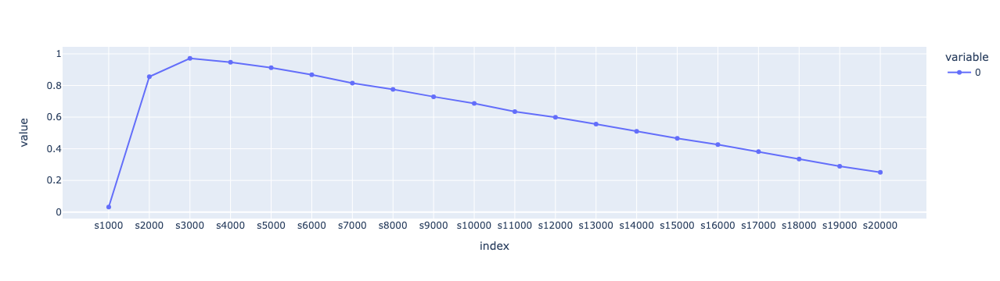

In [16]:
px.line(m_guess_gt, markers=True)

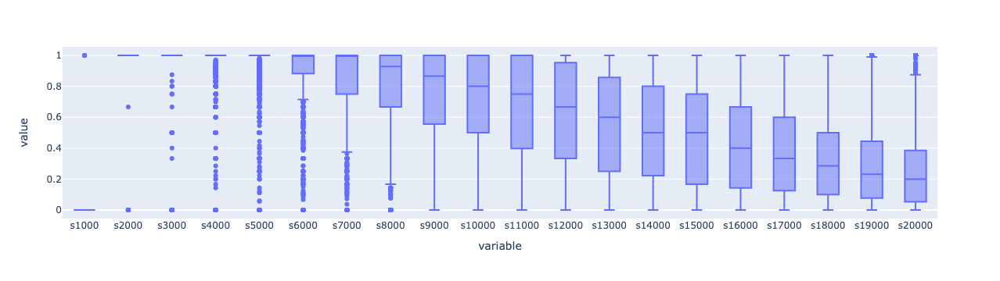

In [17]:
px.box(guess_gt)

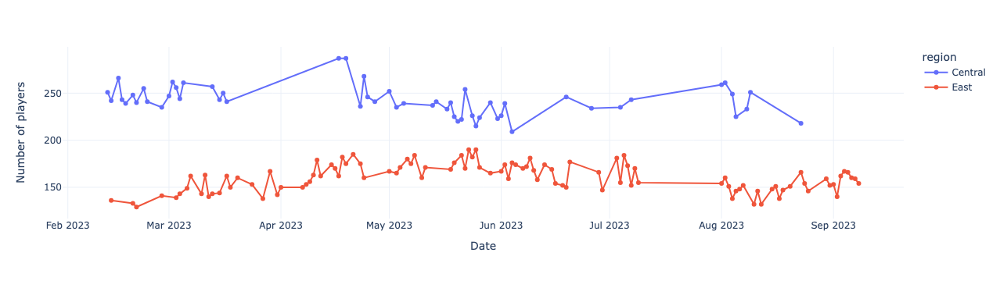

In [18]:
px.line(last_song, x='logDate', y='totalPlayers', markers=True, color='region',
        template='plotly_white',
        labels={'totalPlayers':'Number of players', 'logDate':'Date'})

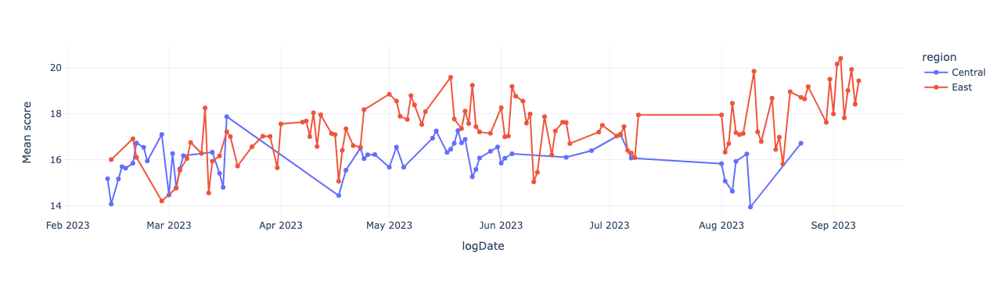

In [19]:
px.line(last_song, x='logDate', y=last_song['Scores'].apply(np.mean), markers=True, color='region',
        template='plotly_white',
        labels={'y':'Mean score', 'index':'Game'})

In [20]:
def add_index(players, index):
    for player in players:
        player['songIndex'] = index
    return players
X['songIndex'] = np.arange(X.shape[0])

In [21]:
X['players_id'] = X.apply(lambda x: add_index(x['players'], x['songIndex']), axis=1)

In [22]:
def flatten(l):
    return [item for sublist in l for item in sublist]
1254572-1255095
1255095-1300192
45097/1300192

0.034684877310428

In [32]:
flat = pd.DataFrame(flatten(X['players_id'].to_list()))
print(flat.info())
flat = flat.loc[(flat['active'] == True)  | (flat['guessTime'].notna())]
flat = flat.drop(['answer','correctGuesses', 'active', 'positionSlot'], axis=1).astype({'score':np.uint8,
                                                                                 'position':np.uint16,
                                                                                 'songIndex':np.uint32,
                                                                                 'guessTime':np.float32}).set_index('songIndex')
flat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1300192 entries, 0 to 1300191
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   name            1300192 non-null  object 
 1   score           1300192 non-null  int64  
 2   correctGuesses  1300192 non-null  int64  
 3   correct         1300192 non-null  bool   
 4   answer          1300192 non-null  object 
 5   guessTime       909072 non-null   float64
 6   active          1300192 non-null  bool   
 7   position        1300192 non-null  int64  
 8   positionSlot    1300192 non-null  int64  
 9   songIndex       1300192 non-null  int64  
dtypes: bool(2), float64(1), int64(5), object(2)
memory usage: 81.8+ MB
None
<class 'pandas.core.frame.DataFrame'>
UInt64Index: 1255095 entries, 0 to 7199
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   name       1255095 non-null  object 
 1   score

,name,score,correct,guessTime,position
songIndex,,,,,
0,1KiiN,1,True,4455.0,1
0,49Leo,0,False,NaN,126
0,5okumajika,0,False,NaN,126
0,abcaiskacang,0,False,19083.0,126
0,Achird,0,False,NaN,126
...,...,...,...,...,...
7199,ZENVlO,20,True,6365.0,75
7199,ZeroDelta_Kuro,2,False,18716.0,149
7199,zfchris,8,False,10402.0,136


In [24]:
flat = pd.read_parquet('./data/players.parquet')
flat.info()

<class 'pandas.core.frame.DataFrame'>
UInt64Index: 1377740 entries, 0 to 9494
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   name       1377740 non-null  object 
 1   score      1377740 non-null  uint8  
 2   correct    1377740 non-null  bool   
 3   guessTime  984212 non-null   float32
 4   position   1377740 non-null  uint16 
dtypes: bool(1), float32(1), object(1), uint16(1), uint8(1)
memory usage: 31.5+ MB


In [25]:
dat = pd.read_parquet('./data/data.parquet')
last = pd.read_parquet('./data/last.parquet')

In [26]:
user = 'TrueXC'
slice_flat = flat.loc[flat['name'] == user]
slice_flat = slice_flat.drop('name', axis=1)

In [41]:
t = dat.join(slice_flat).dropna(subset='score')
t.loc[((t['songNumber'] == 45) & (t['rankedMode'] == 'Novice'))]

,name,artist,songNumber,activePlayers,totalPlayers,difficulty,animeType,tags,genre,logDate,...,avgGuessTime,p_noGuess,p_correctGuess,type_noNumber,samplePercent,AiredDate,score,correct,guessTime,position
44,Little Busters! ~TV animation ver.~,Rita,45,236,251,46.9,TV,"[School, Male Protagonist, Slapstick, School C...","[Comedy, Drama, Slice of Life, Supernatural]",2023-02-12,...,12831.047904,30.084746,50.847458,Opening,0.527853,2012-10-01,26,True,5042.0,21
89,THEME FROM LUPIN III,Peatmac Junior,45,225,242,43.7,TV,"[Police, Seinen, Male Protagonist, Anti-Hero, ...","[Action, Adventure, Comedy, Mystery]",2023-02-13,...,13099.616279,24.444444,47.555556,Opening,0.289636,1977-10-01,31,True,5510.0,8
134,Hey World,Yuka Iguchi,45,233,266,72.0,TV,"[Harem, Magic, Swordplay, Male Protagonist, Pr...","[Action, Adventure, Comedy, Fantasy, Romance]",2023-02-15,...,10264.236715,13.733906,72.961373,Opening,0.435560,2015-04-01,27,True,7140.0,21
179,A Whole New World God Only Knows,Oratorio The World God Only Knows,45,226,243,54.5,TV,"[Demons, Harem, Martial Arts, Parody, School, ...","[Comedy, Romance, Supernatural]",2023-02-16,...,11998.168367,13.716814,61.946903,Opening,0.593269,2011-04-01,28,True,7892.0,9
224,When The Saints Go Marching In,Louis Armstrong,45,219,239,48.6,TV,"[Male Protagonist, Tragedy, Post-Apocalyptic, ...","[Action, Fantasy, Music]",2023-02-17,...,11386.183432,24.200913,42.922374,Insert,0.075339,2021-10-01,28,True,5563.0,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7019,Umi e,Kai Ichinose,45,156,167,61.9,TV,"[Male Protagonist, Coming of Age, Educational,...","[Drama, Music]",2023-09-04,...,12081.136691,11.538462,60.897436,Opening,0.534334,2018-04-01,29,True,12592.0,15
7064,mind forest,Gackt,45,151,166,17.3,movie,"[Military, War, Love Triangle, Real Robot]","[Drama, Mecha, Romance, Sci-Fi]",2023-09-05,...,17065.255319,38.410596,2.649007,Ending,0.217426,2005-04-01,30,False,18668.0,17
7109,Yume no Shima Shinen Kouen,Susumu Hirasawa,45,149,160,59.9,TV,"[Police, Satire, Ensemble Cast, Meta, Episodic...","[Drama, Mystery, Psychological, Supernatural, ...",2023-09-06,...,10410.593985,14.093960,57.046980,Opening,0.327536,2004-01-01,33,True,19059.0,8
7154,Meido no Komoriuta,Reina Kondo,45,144,159,55.6,TV,"[Parody, Tragedy, Primarily Female Cast, Gore,...","[Action, Comedy, Drama]",2023-09-07,...,12327.418803,20.138889,56.944444,Ending,0.155435,2022-10-01,30,False,NaN,18


In [28]:
last_song_u = last.join(slice_flat).dropna(subset='score')

In [30]:
region='East'
mode='Novice'
last_song_u = last_song_u.loc[last_song_u['region'].isin([region])]
last_song_u = last_song_u.loc[last_song_u['rankedMode'].isin([mode])]
X_u = X.loc[X['region'].isin([region])]

In [39]:
last_song_u

,name,artist,anime,songNumber,activePlayers,totalPlayers,type,difficulty,animeType,vintage,...,videoLength,players,logDate,region,rankedMode,Scores,score,correct,guessTime,position
55,PINK BLOOD,Hikaru Utada,"{'english': 'To Your Eternity', 'romaji': 'Fum...",45,118,136,Opening 1,64.2,TV,Spring 2021,...,87.58,"[{'active': True, 'answer': 'Fairy Tail: Final...",2023-02-13,East,Novice,"[8.0, 17.0, 14.0, 30.0, 26.0, 14.0, 13.0, 4.0,...",7,False,NaN,13
56,Wie schön!,Yuri Kasahara,"{'english': 'Black Butler', 'romaji': 'Kuroshi...",45,121,133,Insert Song,32.8,TV,Fall 2008,...,134.83,"[{'active': True, 'answer': 'Kuroshitsuji', 'c...",2023-02-19,East,Novice,"[22.0, 19.0, 11.0, 23.0, 33.0, 28.0, 17.0, 29....",8,True,7358.0,11
57,S・O・S,Megumi Toyoguchi & Haruna Ikezawa,"{'english': 'Alice SOS', 'romaji': 'Alice SOS'}",45,117,129,Opening 1,32.0,TV,Spring 1998,...,88.90,"[{'active': False, 'answer': '...', 'correct':...",2023-02-20,East,Novice,"[8.0, 18.0, 9.0, 27.0, 24.0, 30.0, 26.0, 8.0, ...",9,True,4993.0,11
58,SUREFIRE ~Hikari e Tsunage~,"Natsuki Hanae, Nobuhiko Okamoto, Daisuke Namik...","{'english': 'Starmyu', 'romaji': 'Koukou Hoshi...",45,132,141,Insert Song,47.5,TV,Summer 2019,...,89.66,"[{'active': True, 'answer': 'enstars', 'correc...",2023-02-27,East,Novice,"[26.0, 14.0, 6.0, 13.0, 30.0, 28.0, 2.0, 23.0,...",10,True,6030.0,11
59,here and there,Nagi Yanagi,{'english': 'Kino's Journey: The Beautiful Wor...,45,132,139,Opening 1,31.8,TV,Fall 2017,...,90.04,"[{'active': False, 'answer': '...', 'correct':...",2023-03-03,East,Novice,"[11.0, 18.0, 4.0, 15.0, 17.0, 10.0, 21.0, 13.0...",11,True,5733.0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,Umi e,Kai Ichinose,"{'english': 'Forest of Piano', 'romaji': 'Pian...",45,156,167,Opening 2,61.9,TV,Spring 2018,...,87.96,"[{'active': True, 'answer': 'PIANO NO MORI', '...",2023-09-04,East,Novice,"[16.0, 25.0, 12.0, 12.0, 27.0, 20.0, 9.0, 21.0...",12,False,19969.0,25
156,mind forest,Gackt,{'english': 'Mobile Suit Zeta Gundam: A New Tr...,45,151,166,Ending 2,17.3,movie,Spring 2005,...,252.96,"[{'active': True, 'answer': '...', 'correct': ...",2023-09-05,East,Novice,"[27.0, 19.0, 24.0, 27.0, 31.0, 25.0, 17.0, 21....",13,True,4790.0,24
157,Yume no Shima Shinen Kouen,Susumu Hirasawa,"{'english': 'Paranoia Agent', 'romaji': 'Mouso...",45,149,160,Opening 1,59.9,TV,Winter 2004,...,88.54,"[{'active': True, 'answer': 'Paprika', 'correc...",2023-09-06,East,Novice,"[31.0, 23.0, 27.0, 32.0, 23.0, 24.0, 25.0, 24....",13,False,20657.0,26
158,Meido no Komoriuta,Reina Kondo,"{'english': 'Akiba Maid War', 'romaji': 'Akiba...",45,144,159,Ending 3,55.6,TV,Fall 2022,...,90.07,"[{'active': True, 'answer': 'Akiba Maid War', ...",2023-09-07,East,Novice,"[22.0, 13.0, 28.0, 32.0, 18.0, 38.0, 25.0, 26....",14,True,18537.0,19


In [34]:
s = pd.DataFrame(flatten(X['players_id'].to_list()))

In [36]:
s.loc[s['name'] == 'TrueXC']

,name,score,correctGuesses,correct,answer,guessTime,active,position,positionSlot,songIndex
188,TrueXC,1,1,True,Serial Experiments Lain,4658.0,True,1,21,0
408,TrueXC,2,2,True,Akatsuki no Yona,6167.0,True,1,16,1
632,TrueXC,2,2,False,Ao no Exorcist,19731.0,True,30,41,2
859,TrueXC,3,3,True,Miss Kobayashi's Dragon Maid,3952.0,True,23,39,3
1087,TrueXC,3,3,False,Tamayura: Hitotose,16636.0,True,30,45,4
...,...,...,...,...,...,...,...,...,...,...
1299553,TrueXC,28,28,True,Classroom of the Elite Season 2,9279.0,True,13,18,7195
1299707,TrueXC,29,29,True,Arifureta Shokugyou de Sekai Saikyou,4587.0,True,13,16,7196
1299861,TrueXC,30,30,True,Tonari no Totoro,5064.0,True,13,16,7197
1300015,TrueXC,30,30,False,Cardcaptor Sakura,20199.0,True,13,16,7198


In [42]:
last_song

,name,artist,anime,songNumber,activePlayers,totalPlayers,type,difficulty,animeType,vintage,...,avgGuessTime_c,avgGuessTime_i,type_noNumber,samplePercent,AiredDate,shortest_length,shortest_answer,fastest,fastest_correct,Scores
0,Little Busters! ~TV animation ver.~,Rita,"{'english': 'Little Busters!', 'romaji': 'Litt...",45,236,251,Opening 1,46.9,TV,Fall 2012,...,11459.183333,16333.680851,Opening,0.527853,2012-10-01,15,Little Busters!,4261,4261,"[28.0, 12.0, 21.0, 7.0, 6.0, 15.0, 0.0, 11.0, ..."
1,THEME FROM LUPIN III,Peatmac Junior,"{'english': 'Lupin III: Part II', 'romaji': 'L...",45,225,242,Opening 2,43.7,TV,Fall 1977,...,11494.859813,15741.292308,Opening,0.289636,1977-10-01,9,Lupin III,3814,3814,"[21.0, 12.0, 9.0, 19.0, 7.0, 2.0, 18.0, 15.0, ..."
2,Hey World,Yuka Iguchi,{'english': 'Is It Wrong to Try to Pick Up Gir...,45,233,266,Opening 1,72.0,TV,Spring 2015,...,8569.994118,18048.594595,Opening,0.435560,2015-04-01,8,DanMachi,2021,2021,"[4.0, 36.0, 23.0, 9.0, 28.0, 7.0, 4.0, 16.0, 2..."
3,A Whole New World God Only Knows,Oratorio The World God Only Knows,{'english': 'The World God Only Knows Season T...,45,226,243,Opening 1,54.5,TV,Spring 2011,...,11129.907143,14168.821429,Opening,0.593269,2011-04-01,27,Kami nomi zo Shiru Sekai II,3732,3732,"[9.0, 0.0, 18.0, 25.0, 15.0, 22.0, 11.0, 18.0,..."
4,When The Saints Go Marching In,Louis Armstrong,"{'english': 'Takt Op.Destiny', 'romaji': 'Takt...",45,219,239,Insert Song,48.6,TV,Fall 2021,...,6802.946809,17130.506667,Insert,0.075339,2021-10-01,15,Takt Op.Destiny,2741,2741,"[34.0, 23.0, 7.0, 5.0, 0.0, 0.0, 9.0, 0.0, 14...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,Umi e,Kai Ichinose,"{'english': 'Forest of Piano', 'romaji': 'Pian...",45,156,167,Opening 2,61.9,TV,Spring 2018,...,10431.494737,15642.863636,Opening,0.534334,2018-04-01,13,Piano no Mori,3958,3958,"[16.0, 25.0, 12.0, 12.0, 27.0, 20.0, 9.0, 21.0..."
156,mind forest,Gackt,{'english': 'Mobile Suit Zeta Gundam: A New Tr...,45,151,166,Ending 2,17.3,movie,Spring 2005,...,10306.750000,17365.633333,Ending,0.217426,2005-04-01,39,Mobile Suit Z Gundam: A New Translation,5570,5570,"[27.0, 19.0, 24.0, 27.0, 31.0, 25.0, 17.0, 21...."
157,Yume no Shima Shinen Kouen,Susumu Hirasawa,"{'english': 'Paranoia Agent', 'romaji': 'Mouso...",45,149,160,Opening 1,59.9,TV,Winter 2004,...,9087.917647,12752.833333,Opening,0.327536,2004-01-01,14,Paranoia Agent,3113,3113,"[31.0, 23.0, 27.0, 32.0, 23.0, 24.0, 25.0, 24...."
158,Meido no Komoriuta,Reina Kondo,"{'english': 'Akiba Maid War', 'romaji': 'Akiba...",45,144,159,Ending 3,55.6,TV,Fall 2022,...,11003.560976,15429.028571,Ending,0.155435,2022-10-01,14,Akiba Maid War,3446,3446,"[22.0, 13.0, 28.0, 32.0, 18.0, 38.0, 25.0, 26...."
